In [ ]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Disponible GPU:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.15.0
Disponible GPU: []


In [ ]:
# !pip install tensorflow
# !pip install keras

In [ ]:
# To display inline graphics in the notebook
%matplotlib inline

# Libraries for image and data manipulation
import cv2
import shutil
import math
import random
import numpy as np
import pandas as pd
from IPython.display import HTML
from base64 import b64encode

# Machine learning and deep learning libraries
import keras
import tensorflow as tf

from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import MobileNetV2, VGG16, VGG19, ResNet50, InceptionResNetV2
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, LSTM, Dense, Activation, GlobalAveragePooling2D
from keras.optimizers import Adam, RMSprop
from keras.callbacks import Callback, EarlyStopping
from keras.applications.mobilenet_v2 import MobileNetV2
from sklearn.model_selection import KFold, cross_val_score
from collections import deque
from keras.layers import *
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
import torch

# Data visualization libraries
import matplotlib.pyplot as plt
plt.style.use("seaborn")
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Libraries for file manipulation and time
import os
import h5py
from datetime import datetime
import pytz

# Libraries for evaluation metrics and data analysis
from sklearn.metrics import (
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    accuracy_score,
    balanced_accuracy_score,
)
from tabulate import tabulate

# Other general libraries
from random import shuffle
import sys
import gc
keras.__version__

<ipython-input-4-5d6f9862bc09>:36: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


'2.15.0'

In [ ]:
def Play_Video(filepath):
    html = ''
    video = open(filepath, 'rb').read()
    src = 'data:video/avi;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/avi"></video>' % src
    return HTML(html)

In [ ]:
ViolnceVideos_Dir = "/content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset/Violence"
NonViolnceVideos_Dir="/content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset/NonViolence"

In [ ]:
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

In [ ]:
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 16

In [ ]:
DATASET_DIR="/content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset"

In [ ]:
CLASSES_LIST = ["NonViolence", "Violence"]

In [ ]:
# Define the directory containing the videos
# in_dir_rwf_fight = "/content/drive/MyDrive/CSE499A/RWF-2000/train/Fight"

# Function to get the names of the videos in the directory
def get_video_names(directory, num_videos=5):
    video_names = []
    count = 0

    # Iterate over the files in the directory
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(".avi"):
                video_names.append(os.path.join(root, file))
                count += 1
                if count == num_videos:
                    break
        if count == num_videos:
            break

    return video_names

# Get the names of the first 5 videos in the directory
video_names = get_video_names(ViolnceVideos_Dir)

# Display the names of the videos
print("First 5 videos in the directory:")
for video_name in video_names:
    print(video_name)

First 5 videos in the directory:


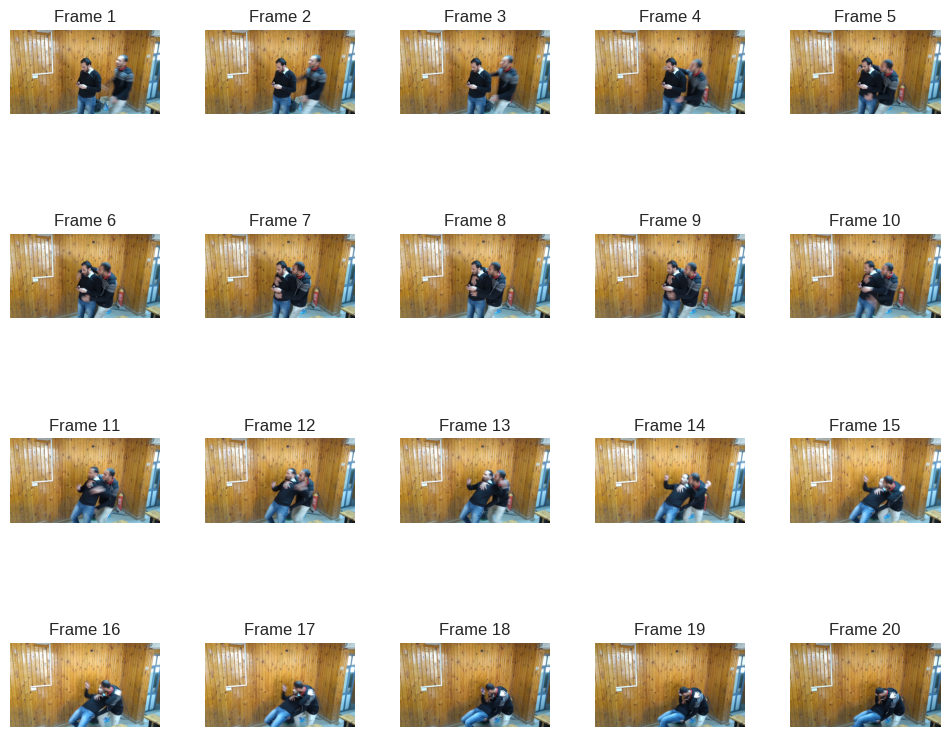

In [ ]:
def load_frames(video_path, num_frames=20):
    frames = []
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = [int(i * total_frames / num_frames) for i in range(num_frames)]

    for idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if ret:
            frames.append(frame)
        else:
            print(f"Frame {idx} not loaded!")

    cap.release()
    return frames

def plot_frames(frames):
    num_frames = len(frames)
    fig, axes = plt.subplots(4, 5, figsize=(12, 10))
    fig.subplots_adjust(hspace=0.3, wspace=0.3)
    for i, ax in enumerate(axes.flat):
        if i < num_frames:
            ax.imshow(cv2.cvtColor(frames[i], cv2.COLOR_BGR2RGB))
            ax.set_title(f"Frame {i+1}")
            ax.axis("off")
        else:
            ax.axis("off")
    plt.show()

# Example usage:
video_path = '/content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset/Violence/V_1.mp4'
frames = load_frames(video_path, num_frames=20)
plot_frames(frames)

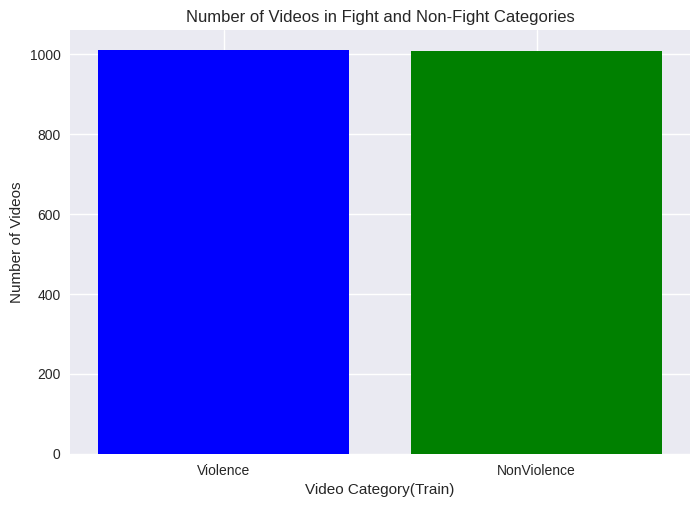

In [ ]:
def count_videos(directory):
    count_fight = len(os.listdir(os.path.join(directory, 'Violence')))
    count_nonfight = len(os.listdir(os.path.join(directory, 'NonViolence')))
    return count_fight, count_nonfight

def plot_video_count(directory):
    fight_count, nonfight_count = count_videos(directory)
    categories = ['Violence', 'NonViolence']
    counts = [fight_count, nonfight_count]

    plt.bar(categories, counts, color=['blue', 'green'])
    plt.xlabel('Video Category(Train)')
    plt.ylabel('Number of Videos')
    plt.title('Number of Videos in Fight and Non-Fight Categories')
    plt.show()

# Define the input directory
#in_dir_rwf = "/content/drive/MyDrive/CSE499A/RWF-2000/train"

# Plot the video count
plot_video_count(DATASET_DIR)

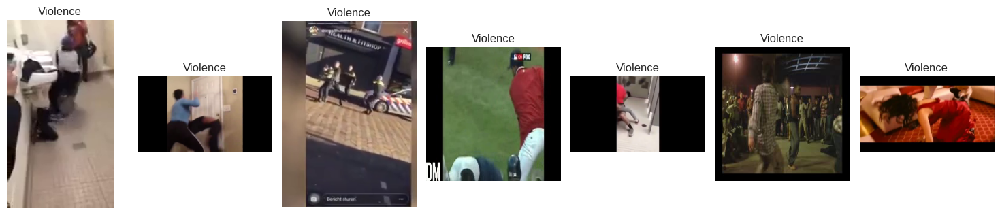

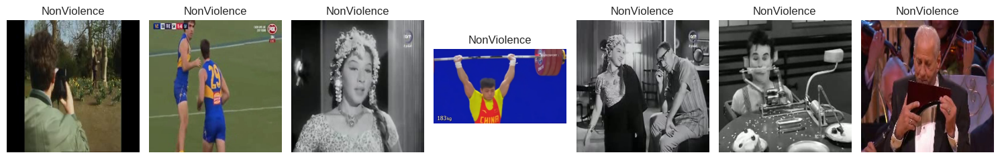

In [ ]:
import random
# Define the paths to the Fight and NonFight folders
#in_dir_rwf_fight = "/content/drive/MyDrive/CSE499A/RWF-2000/train/Fight"
# non_fight_dir = "/content/drive/MyDrive/CSE499A/RWF-2000/train/NonFight"

# Function to plot a grid of random frames from videos
def plot_random_frames(folder_path, label):
    plt.figure(figsize=(15, 12))
    for i in range(1, 8):
        plt.subplot(4, 7, i)
        video_name = random.choice(os.listdir(folder_path))
        video_path = os.path.join(folder_path, video_name)
        cap = cv2.VideoCapture(video_path)
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        random_frame_index = random.randint(0, frame_count - 1)
        cap.set(cv2.CAP_PROP_POS_FRAMES, random_frame_index)
        ret, frame = cap.read()
        if ret:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            plt.imshow(frame_rgb)
            plt.axis('off')
            plt.title(label)
        cap.release()
    plt.tight_layout()
    plt.show()

# Plot random frames from the Fight folder
plot_random_frames(ViolnceVideos_Dir, "Violence")

# Plot random frames from the NonFight folder
plot_random_frames(NonViolnceVideos_Dir, "NonViolence")


# ViolnceVideos_Dir = "/content/drive/MyDrive/CSE499A/archive/RWF-2000/train/Fight"
# NonViolnceVideos_Dir="/content/drive/MyDrive/CSE499A/archive/RWF-2000/train/NonFight"

In [ ]:
# Function to get width and height of a video
def get_video_dimensions(video_path):
    # Open the video file
    video_capture = cv2.VideoCapture(video_path)

    # Get the width and height of the video
    width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))

    return width, height

# Function to choose a random video and get its dimensions
def get_random_video_dimensions(folder):
    # Get a list of video files in the folder
    video_files = [file for file in os.listdir(folder) if file.endswith(".mp4")]

    # Choose a random video file
    random_video_file = random.choice(video_files)

    # Construct the full path to the video file
    video_path = os.path.join(folder, random_video_file)

    # Get the dimensions of the random video
    width, height = get_video_dimensions(video_path)

    return width, height

# Get dimensions of a random video from the Fight folder
fight_width, fight_height = get_random_video_dimensions(ViolnceVideos_Dir)
print("Dimensions of a random video from the Fight folder:")
print("Width:", fight_width, "Height:", fight_height)

# Get dimensions of a random video from the NonFight folder
nonfight_width, nonfight_height = get_random_video_dimensions(NonViolnceVideos_Dir)
print("\nDimensions of a random video from the NonFight folder:")
print("Width:", nonfight_width, "Height:", nonfight_height)

Dimensions of a random video from the Fight folder:
Width: 224 Height: 224

Dimensions of a random video from the NonFight folder:
Width: 224 Height: 224


In [ ]:
# Define a function to get video dimensions and class
def get_video_info(folder_path, class_name):
    video_info = []
    for video_file in os.listdir(folder_path)[:5]:  # Get the first 5 videos
        if video_file.endswith(".mp4"):
            video_path = os.path.join(folder_path, video_file)
            width, height = get_video_dimensions(video_path)
            video_info.append((video_file, width, height, class_name))
    return video_info

# Get video info for fight and non-fight folders
fight_video_info = get_video_info(ViolnceVideos_Dir, "Violence")
nonfight_video_info = get_video_info(NonViolnceVideos_Dir, "NonViolence")

# Combine the video info lists
all_video_info = fight_video_info + nonfight_video_info

# Print the first 5 rows with padding between columns
print("First 5 rows of video dimensions:")
print("File Name\t\tWidth\t\tHeight\t\tClass")
for video_file, width, height, class_name in all_video_info:
    print(f"{video_file.ljust(20)}{str(width).ljust(8)}{str(height).ljust(8)}{class_name}")

First 5 rows of video dimensions:
File Name		Width		Height		Class
V_101.mp4           640     360     Violence
V_112.mp4           204     360     Violence
V_114.mp4           1280    720     Violence
V_113.mp4           204     360     Violence
V_109.mp4           640     360     Violence
NV_106.mp4          224     224     NonViolence
NV_113.mp4          224     224     NonViolence
NV_10.mp4           224     224     NonViolence
NV_110.mp4          224     224     NonViolence
NV_11.mp4           1280    720     NonViolence


Processing video: /content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset/Violence/V_220.mp4


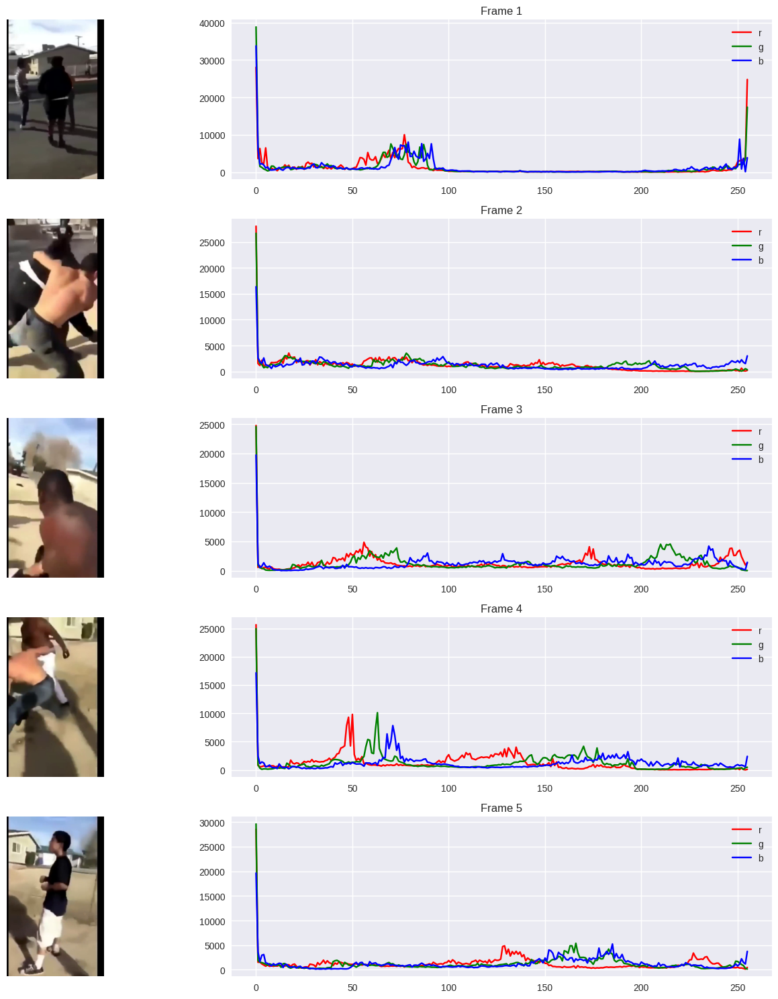

In [ ]:
def random_video_path(folder_path):
    video_files = [file for file in os.listdir(folder_path) if file.endswith('.mp4')]
    if not video_files:
        print("No video files found in the folder.")
        return None
    return os.path.join(folder_path, random.choice(video_files))

# Get a random video path from the Fight folder
# in_dir_rwf_fight = "/content/drive/MyDrive/CSE499A/archive/RWF-2000/train/Fight"
video_path = random_video_path(ViolnceVideos_Dir)

# Function to extract frames from a video
def extract_frames(video_path, num_frames=5):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = np.linspace(0, frame_count - 1, num_frames, dtype=int)
    frames = []

    for idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if ret:
            frames.append(frame)

    cap.release()
    return frames

# Function to show color distribution for frames extracted from a video
def show_color_dist_video(video_path, num_frames=5):
    frames = extract_frames(video_path, num_frames)

    fig, axs = plt.subplots(num_frames, 2, figsize=(15, 15))

    for idx, frame in enumerate(frames):
        axs[idx, 0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axs[idx, 0].axis('off')

        axs[idx, 1].set_title(f'Frame {idx + 1}')
        color_channels = ('r', 'g', 'b')
        for i, color in enumerate(color_channels):
            channel_histogram = cv2.calcHist([frame], [i], None, [256], [0, 256])
            axs[idx, 1].plot(channel_histogram, color=color, label=color)
        axs[idx, 1].legend()

    plt.tight_layout()
    plt.show()

# Example usage:
if video_path:
    print(f"Processing video: {video_path}")
    show_color_dist_video(video_path)

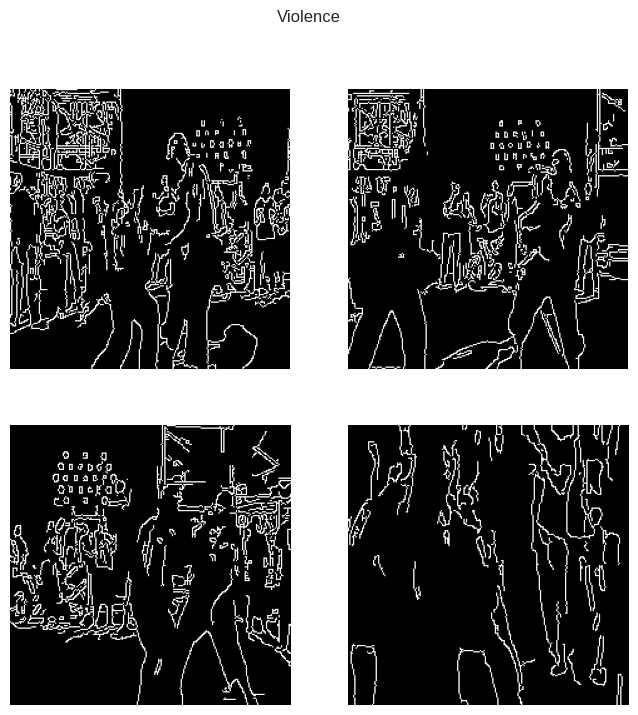

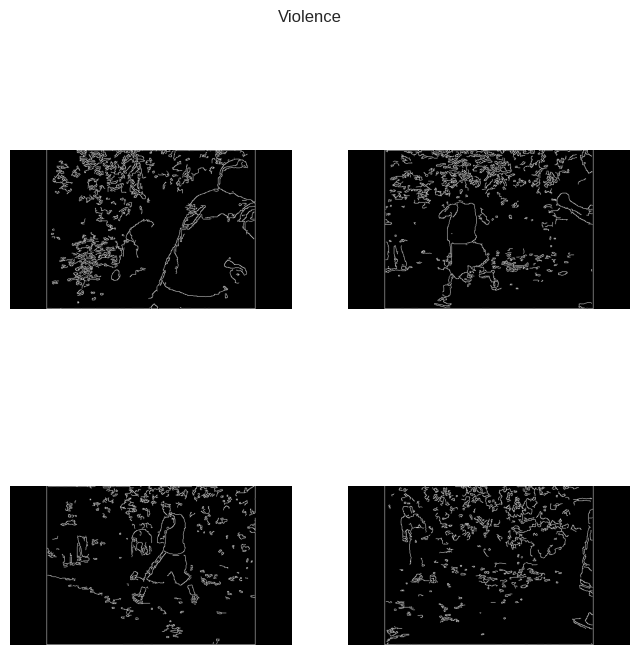

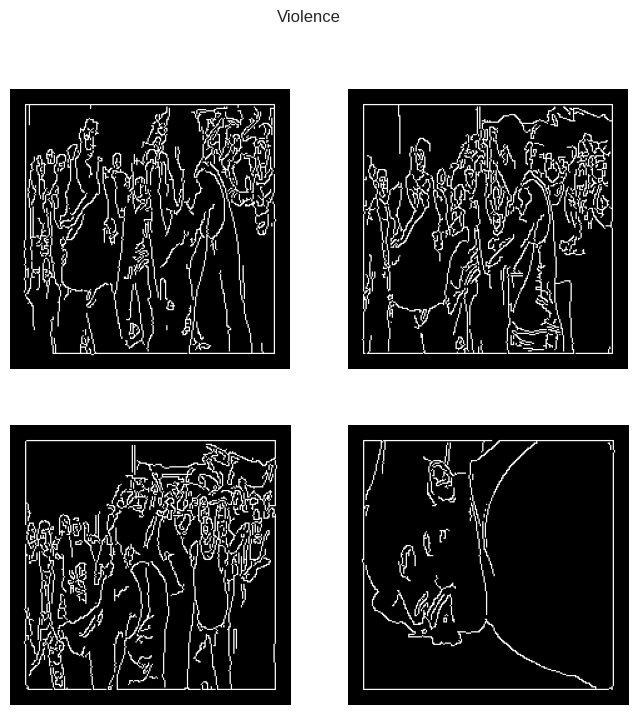

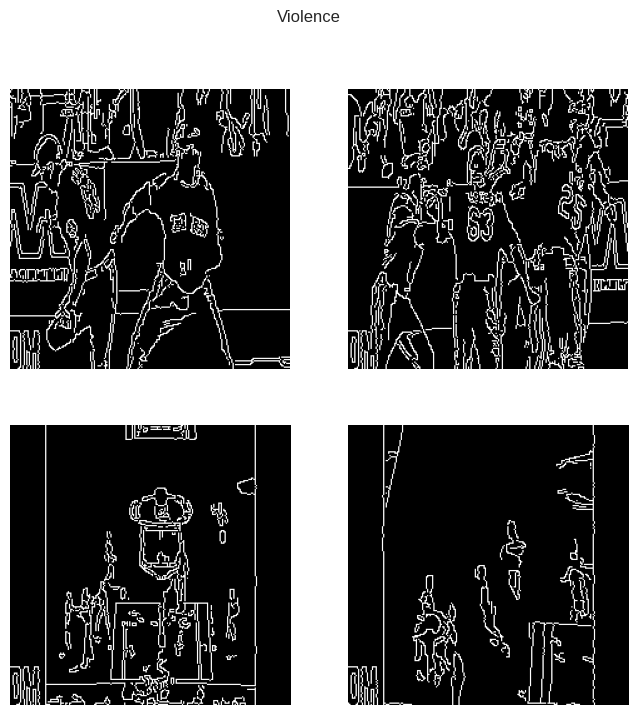

In [ ]:
def random_video_paths(folder_path, num_videos=4):
    video_paths = []
    # Get all video file paths from the folder
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('.mp4', '.avi', '.mkv')):
                video_paths.append(os.path.join(root, file))
    # Return a random sample of video paths
    return random.sample(video_paths, min(num_videos, len(video_paths)))

def edges_videos_gray(class_name, video_paths):
    for idx, video_path in enumerate(video_paths):
        cap = cv2.VideoCapture(video_path)
        num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        frame_indices = np.linspace(0, num_frames - 1, 4, dtype=int)

        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(class_name)

        for sub_idx, frame_idx in enumerate(frame_indices):
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = cap.read()
            if ret:
                gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                edges = cv2.Canny(gray, 50, 150)

                plt.subplot(2, 2, sub_idx + 1)
                plt.imshow(edges, cmap='gray')
                plt.axis('off')

        plt.show()
        cap.release()

# Example usage:
# Define the path to the Fight folder
# in_dir_rwf_fight = "/content/drive/MyDrive/CSE499A/archive/RWF-2000/train/Fight"

# Get random video paths from the Fight folder
random_videos = random_video_paths(ViolnceVideos_Dir)

# Call the function
if len(random_videos) > 0:
    edges_videos_gray("Violence", random_videos)
else:
    print("No videos found in the Fight folder.")

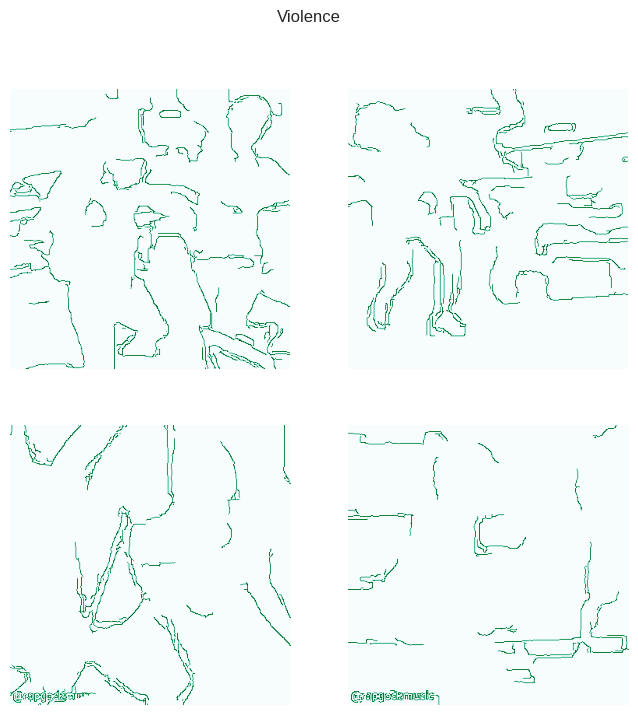

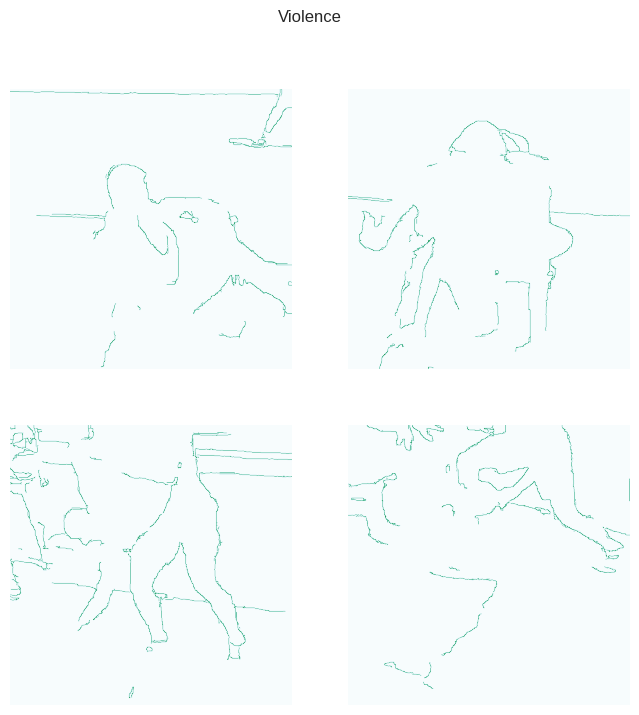

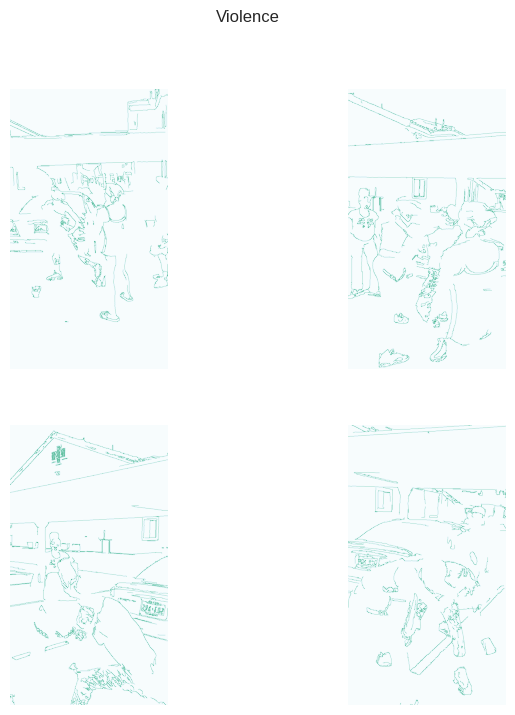

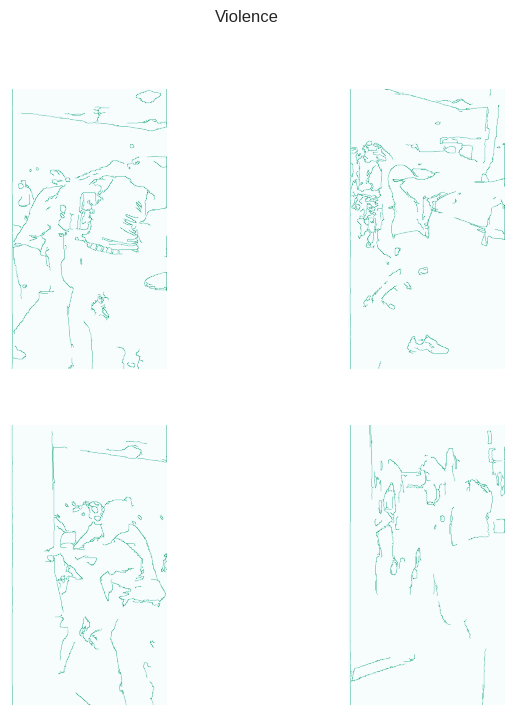

In [ ]:
def edges_videos_white(class_name, video_paths):
    for idx, video_path in enumerate(video_paths):
        cap = cv2.VideoCapture(video_path)
        num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        frame_indices = np.linspace(0, num_frames - 1, 4, dtype=int)

        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(class_name)

        for sub_idx, frame_idx in enumerate(frame_indices):
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = cap.read()
            if ret:
                gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                edges = cv2.Canny(gray, 50, 150)

                plt.subplot(2, 2, sub_idx + 1)
                plt.imshow(edges, cmap='BuGn')
                plt.axis('off')

        plt.show()
        cap.release()


# Get random video paths from the Fight folder
random_videos = random_video_paths(ViolnceVideos_Dir)

# Call the function
if len(random_videos) > 0:
    edges_videos_white("Violence", random_videos)
else:
    print("No videos found in the Fight folder.")

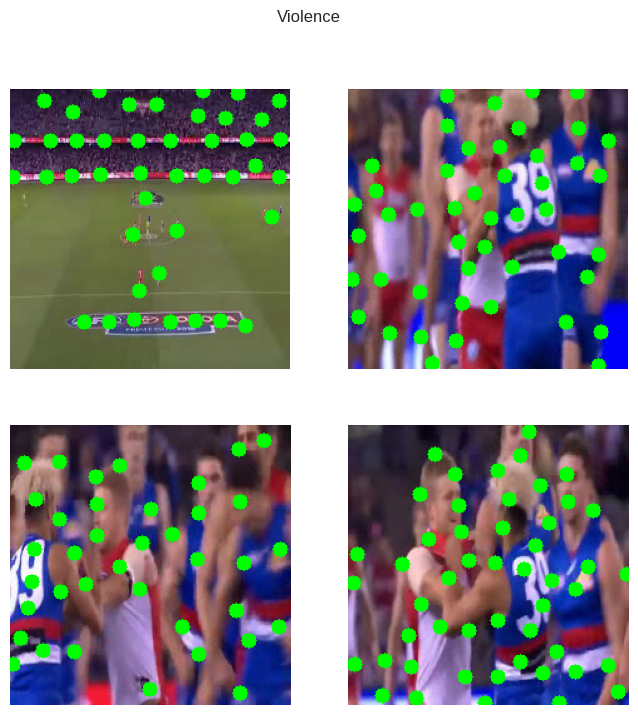

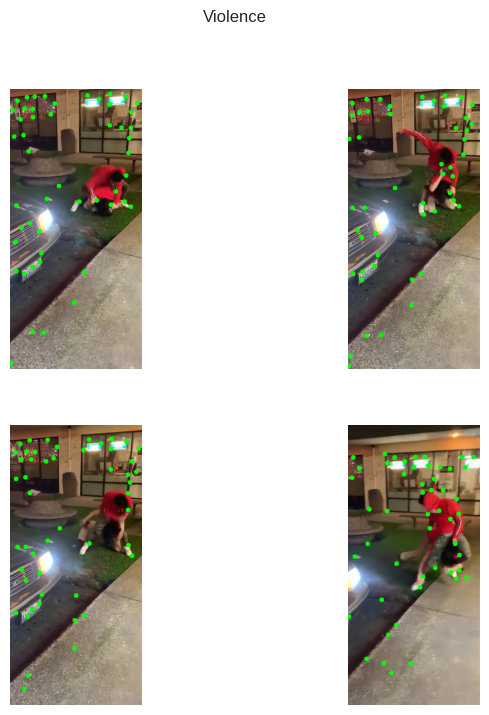

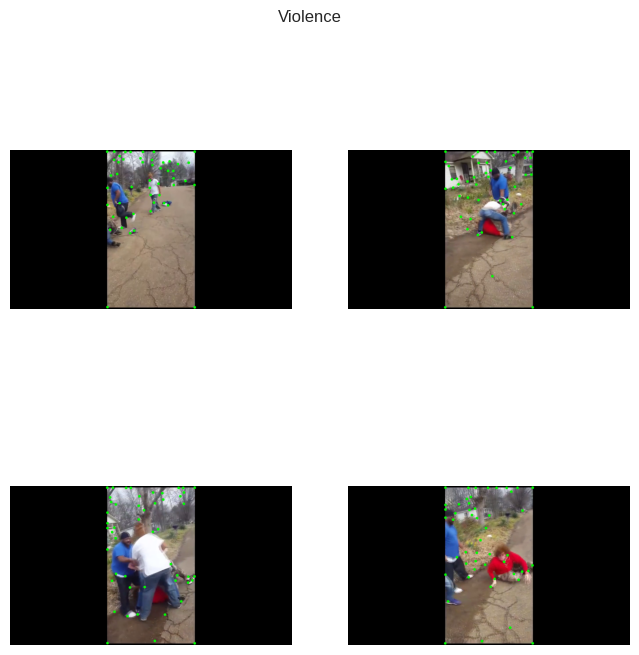

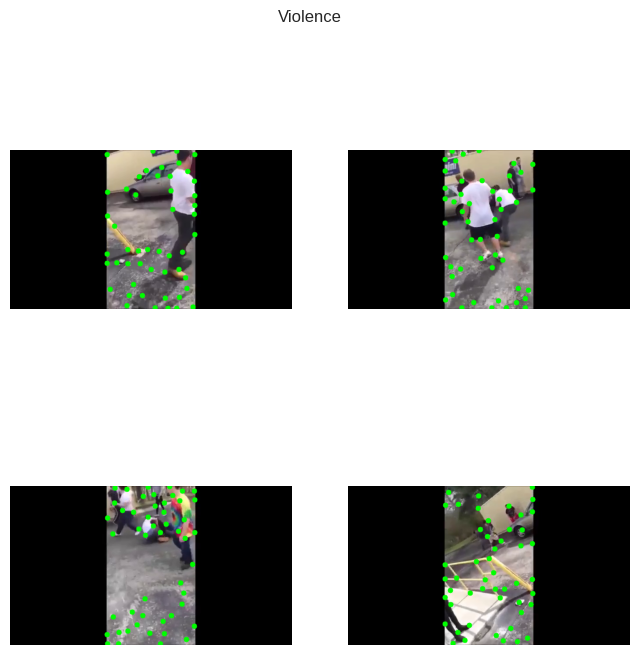

In [ ]:
def corners_videos_gray(class_name, video_paths):
    for idx, video_path in enumerate(video_paths):
        cap = cv2.VideoCapture(video_path)
        num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        frame_indices = np.linspace(0, num_frames - 1, 4, dtype=int)

        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(class_name)

        for sub_idx, frame_idx in enumerate(frame_indices):
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = cap.read()
            if ret:
                gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                corners = cv2.goodFeaturesToTrack(gray, maxCorners=50, qualityLevel=0.02, minDistance=20)
                corners = np.float32(corners)
                for item in corners:
                    x, y = item[0]
                    cv2.circle(frame, (int(x), int(y)), 6, (0, 255, 0), -1)

                plt.subplot(2, 2, sub_idx + 1)
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.axis('off')

        plt.show()
        cap.release()

# Example usage:
# Define the path to the Fight folder
#in_dir_rwf_fight = "/content/drive/MyDrive/CSE499A/archive/RWF-2000/train/Fight"

# Get random video paths from the Fight folder
random_videos = random_video_paths(ViolnceVideos_Dir)

# Call the function
if len(random_videos) > 0:
    corners_videos_gray("Violence", random_videos)
else:
    print("No videos found in the Fight folder.")

In [ ]:
def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    video_reader.release()
    return frames_list

In [ ]:
features, labels, video_files_paths = np.load("/content/drive/MyDrive/CSE499A/Colab pys/features.npy"), np.load("/content/drive/MyDrive/CSE499A/Colab pys/labels.npy"), np.load("/content/drive/MyDrive/CSE499A/Colab pys/video_files_paths.npy")

In [ ]:
one_hot_encoded_labels = to_categorical(labels)
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size=0.1,
                                                                            shuffle=True, random_state=42)

In [ ]:
print(features_train.shape, labels_train.shape)
print(features_test.shape, labels_test.shape)

(1800, 16, 64, 64, 3) (1800, 2)
(200, 16, 64, 64, 3) (200, 2)


In [ ]:
features_train_reshaped = features_train.reshape(features_train.shape[0], features_train.shape[1], -1)
features_test_reshaped = features_test.reshape(features_test.shape[0], features_test.shape[1], -1)

In [ ]:
mobilenet = MobileNetV2(include_top=False, weights="imagenet")
mobilenet.trainable = True

In [ ]:
for layer in mobilenet.layers[:-40]:
    layer.trainable = False

In [ ]:
def create_model():
    model = Sequential()
    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(mobilenet))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards=True)
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))

    model.add(Dropout(0.25))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(len(CLASSES_LIST), activation='softmax'))

    model.summary()
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 16, 2, 2, 1280)    2257984   
 ributed)                                                        
                                                                 
 dropout (Dropout)           (None, 16, 2, 2, 1280)    0         
                                                                 
 time_distributed_1 (TimeDi  (None, 16, 5120)          0         
 stributed)                                                      
                                                                 
 bidirectional (Bidirection  (None, 64)                1319168   
 al)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

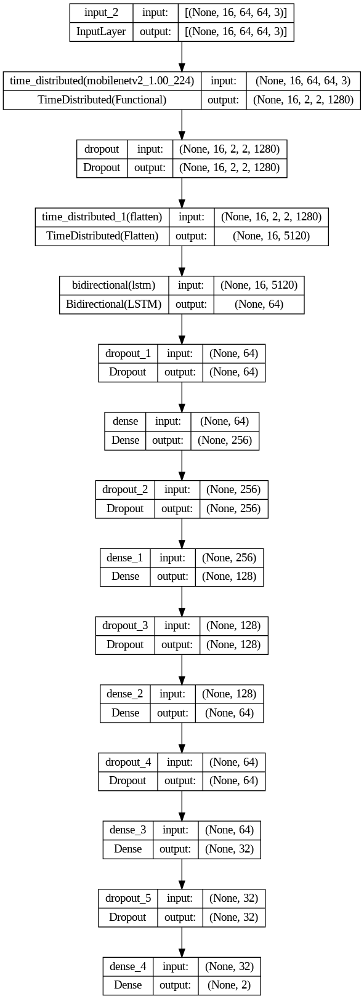

In [ ]:
MoBiLSTM_model = create_model()
plot_model(MoBiLSTM_model, to_file='/content/drive/MyDrive/CSE499A/Colab pys/MobBiLSTM_model_structure_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
early_stopping_callback = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.6, patience=5, min_lr=0.00005, verbose=1)

In [ ]:
MoBiLSTM_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=["accuracy"])
MobBiLSTM_model_history = MoBiLSTM_model.fit(x=features_train, y=labels_train, epochs=50, batch_size=8,
                                             shuffle=True, validation_split=0.2,
                                             callbacks=[early_stopping_callback, reduce_lr])

Epoch 1/50
180/180 [==============================] - 237s 1s/step - loss: 0.6986 - accuracy: 0.5014 - val_loss: 0.6929 - val_accuracy: 0.5000 - lr: 0.0100
Epoch 2/50
180/180 [==============================] - 214s 1s/step - loss: 0.6880 - accuracy: 0.5521 - val_loss: 0.6778 - val_accuracy: 0.6167 - lr: 0.0100
Epoch 3/50
180/180 [==============================] - 217s 1s/step - loss: 0.6637 - accuracy: 0.5979 - val_loss: 0.6071 - val_accuracy: 0.7417 - lr: 0.0100
Epoch 4/50
180/180 [==============================] - 216s 1s/step - loss: 0.5959 - accuracy: 0.6896 - val_loss: 0.5503 - val_accuracy: 0.7528 - lr: 0.0100
Epoch 5/50
180/180 [==============================] - 214s 1s/step - loss: 0.4716 - accuracy: 0.7868 - val_loss: 0.6458 - val_accuracy: 0.6833 - lr: 0.0100
Epoch 6/50
180/180 [==============================] - 214s 1s/step - loss: 0.4007 - accuracy: 0.8417 - val_loss: 0.3186 - val_accuracy: 0.8667 - lr: 0.0100
Epoch 7/50
180/180 [==============================] - 212s 1s/st

In [ ]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 27s 3s/step - loss: 0.0767 - accuracy: 0.9650


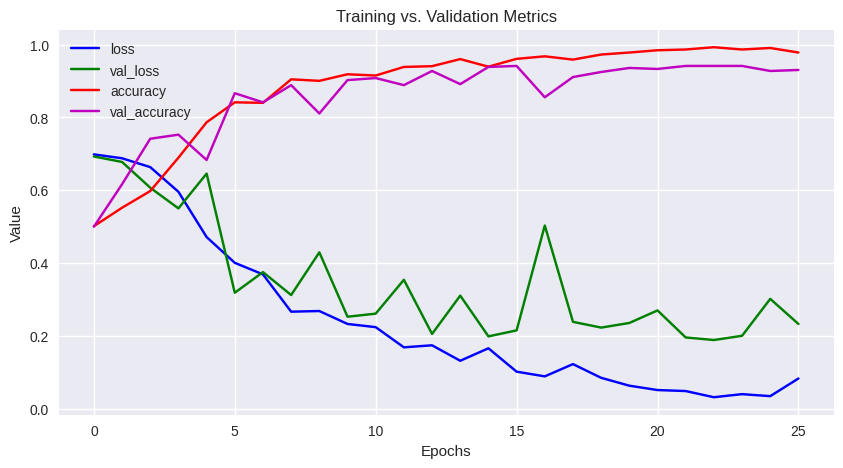

In [ ]:
# Define a function to plot the metrics
def plot_metric(model_training_history, metric_name_1, metric_name_2, metric_name_3, metric_name_4, plot_name):
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    metric_value_3 = model_training_history.history[metric_name_3]
    metric_value_4 = model_training_history.history[metric_name_4]
    epochs = range(len(metric_value_1))

    plt.figure(figsize=(10, 5))
    plt.plot(epochs, metric_value_1, 'b', label=metric_name_1)   # Blue for metric_name_1
    plt.plot(epochs, metric_value_2, 'g', label=metric_name_2)   # Green for metric_name_2
    plt.plot(epochs, metric_value_3, 'r', label=metric_name_3)   # Red for metric_name_3
    plt.plot(epochs, metric_value_4, 'm', label=metric_name_4)   # Magenta for metric_name_4
    plt.title(plot_name)
    plt.xlabel('Epochs')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the metrics with distinct colors
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'accuracy', 'val_accuracy', 'Training vs. Validation Metrics')

In [ ]:
labels_predict = MoBiLSTM_model.predict(features_test)
labels_predict = np.argmax(labels_predict, axis=1)
labels_test_normal = np.argmax(labels_test, axis=1)

7/7 [==============================] - 13s 2s/step


In [ ]:
from sklearn.metrics import accuracy_score

AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.965


[Text(0, 0.5, 'NonFight'), Text(0, 1.5, 'Fight')]

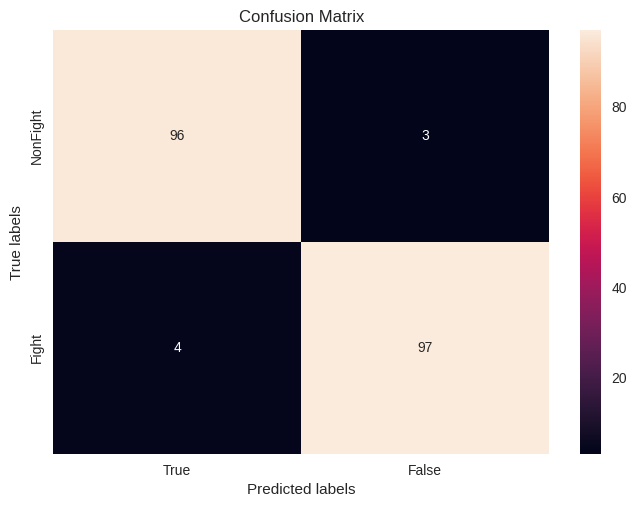

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

ax = plt.subplot()
cm = confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['True', 'False'])
ax.yaxis.set_ticklabels(['NonFight', 'Fight'])

In [ ]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal, labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.96      0.97      0.96        99
           1       0.97      0.96      0.97       101

    accuracy                           0.96       200
   macro avg       0.96      0.97      0.96       200
weighted avg       0.97      0.96      0.97       200



In [ ]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    # video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
    #                                video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'XVID'),
                               video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
    frames_queue = deque(maxlen=SEQUENCE_LENGTH)
    predicted_class_name = ''

    while video_reader.isOpened():
        ok, frame = video_reader.read()

        if not ok:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_queue.append(normalized_frame)

        if len(frames_queue) == SEQUENCE_LENGTH:
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis=0))[0]
            predicted_label = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label]

        if predicted_class_name == "Fight":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

        video_writer.write(frame)

    video_reader.release()
    video_writer.release()

plt.style.use("default")

# def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
#     video_reader = cv2.VideoCapture(video_file_path)
#     original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
#     original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
#     video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
#                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
#     frames_queue = deque(maxlen=SEQUENCE_LENGTH)
#     predicted_class_name = ''

#     while video_reader.isOpened():
#         ok, frame = video_reader.read()

#         if not ok:
#             break

#         resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
#         normalized_frame = resized_frame / 255
#         frames_queue.append(normalized_frame)

#         if len(frames_queue) == SEQUENCE_LENGTH:
#             predicted_labels_probabilities = vivit_model.predict(np.expand_dims(frames_queue, axis=0))[0]
#             predicted_label = np.argmax(predicted_labels_probabilities)
#             predicted_class_name = CLASSES_LIST[predicted_label]

#         if predicted_class_name == "Fight":
#             cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
#         else:
#             cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

#         video_writer.write(frame)

#     video_reader.release()
#     video_writer.release()

# plt.style.use("default")

In [ ]:
# def show_pred_frames(pred_video_path):
#     plt.figure(figsize=(20, 15))
#     video_reader = cv2.VideoCapture(pred_video_path)
#     frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
#     random_range = sorted(random.sample(range(SEQUENCE_LENGTH, frames_count), 12))

#     for counter, random_index in enumerate(random_range, 1):
#         plt.subplot(5, 4, counter)
#         video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
#         ok, frame = video_reader.read()

#         if not ok:
#             break

#         frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#         plt.imshow(frame)
#         ax.figure.set_size_inches(20, 20)
#         plt.tight_layout()

#     video_reader.release()


def show_pred_frames(pred_video_path):
    plt.figure(figsize=(20, 15))
    video_reader = cv2.VideoCapture(pred_video_path)
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    random_range = sorted(random.sample(range(SEQUENCE_LENGTH, frames_count), 12))

    for counter, random_index in enumerate(random_range, 1):
        plt.subplot(5, 4, counter)
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
        ok, frame = video_reader.read()

        if not ok:
            break

        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.axis('off')  # Hide axis

    plt.tight_layout()  # Ensure the layout is neat and tight
    video_reader.release()


In [ ]:
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.avi'

1/1 [==============================] - 0s 65ms/step


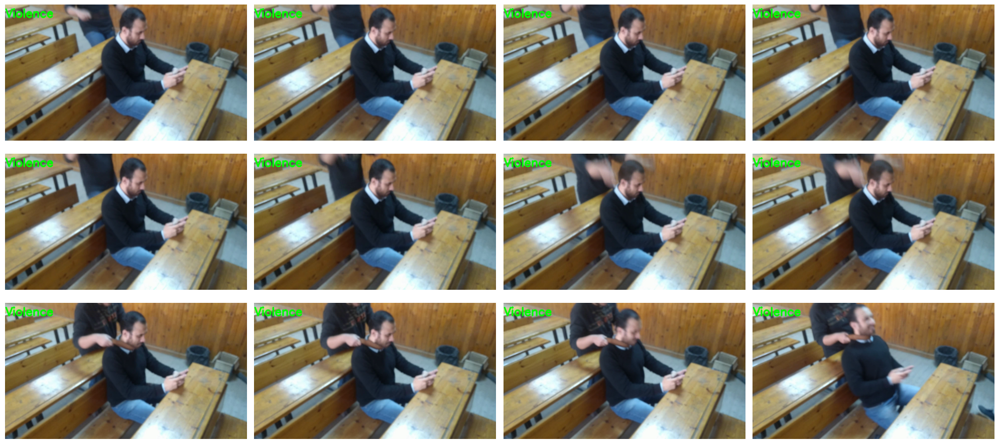

In [ ]:
input_video_file_path = "/content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset/Violence/V_10.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 61ms/step


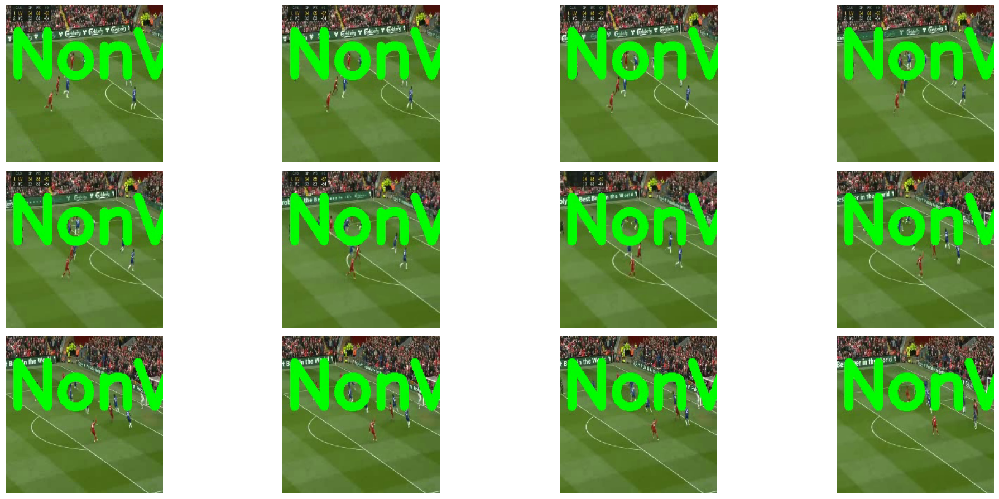

In [ ]:
input_video_file_path = "/content/drive/MyDrive/CSE499A/archive/Real Life Violence Dataset/NonViolence/NV_101.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

In [ ]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_list = []
    predicted_class_name = ''
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis=0))[0]
    predicted_label = np.argmax(predicted_labels_probabilities)
    predicted_class_name = CLASSES_LIST[predicted_label]

    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    video_reader.release()

In [ ]:
!pip install pytube

from pytube import YouTube

def predict_video_from_url(video_url, sequence_length=16):
    try:
        # Get YouTube video details using pytube
        youtube_video = YouTube(video_url)
        video_stream = youtube_video.streams.filter(file_extension="mp4").first()
        video_stream_url = video_stream.url

        # Perform prediction on the video
        predict_video(video_stream_url, sequence_length)

    except Exception as e:
        print(f"Error: {e}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.5 MB/s eta 0:00:00


In [ ]:
# Test the user video URL prediction function
user_video_url = "https://www.youtube.com/watch?v=QC8iQqtG0hg&pp=ygUPNSBzZWNvbmRzIHZpZGVv"
predict_video_from_url(user_video_url)

1/1 [==============================] - 0s 96ms/step
Predicted: NonViolence
Confidence: 0.9053947329521179


In [ ]:
# Cell: Evaluate the Model
val_loss, val_acc = MoBiLSTM_model.evaluate(features_test, labels_test)
print(f'Validation Accuracy: {val_acc:.2f}')

# Confusion matrix and classification report
y_pred = np.argmax(MoBiLSTM_model.predict(features_test), axis=1)
y_true = np.argmax(labels_test, axis=1)
print(confusion_matrix(y_true, y_pred))
print(f'F1 Score: {f1_score(y_true, y_pred):.2f}')
print(f'Precision: {precision_score(y_true, y_pred):.2f}')
print(f'Recall: {recall_score(y_true, y_pred):.2f}')

7/7 [==============================] - 30s 4s/step - loss: 0.0767 - accuracy: 0.9650
Validation Accuracy: 0.96
7/7 [==============================] - 32s 4s/step
[[96  3]
 [ 4 97]]
F1 Score: 0.97
Precision: 0.97
Recall: 0.96


In [ ]:
import tensorflow as tf
import time
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define a function to measure performance
def measure_performance(model, input_shape, num_samples=100):
    # Create random data to simulate the inputs
    dummy_input = tf.random.normal(input_shape)

    # Warm-up run
    model(dummy_input)

    # Measure inference time
    start_time = time.time()
    for _ in range(num_samples):
        model(dummy_input)
    total_time = time.time() - start_time
    inference_time = (total_time / num_samples) * 1000  # Inference time in milliseconds

    # Measure FPS (Frames Per Second)
    fps = num_samples / total_time

    # Measure FLOPs using tf.profiler
    concrete_func = tf.function(model).get_concrete_function(dummy_input)
    frozen_func = convert_variables_to_constants_v2(concrete_func)
    run_meta = tf.compat.v1.RunMetadata()
    opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
    flops = tf.compat.v1.profiler.profile(graph=frozen_func.graph, run_meta=run_meta, options=opts)

    return flops.total_float_ops, fps, inference_time

# # Measure performance for ViViT model
# input_shape_vivit = (1, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, NUM_CHANNELS)  # Update with your actual input shape
# flops_vivit, fps_vivit, inference_time_vivit = measure_performance(vivit_model, input_shape_vivit)

# # Print ViViT model performance
# print(f"ViViT Model FLOPs: {flops_vivit}")
# print(f"ViViT Model FPS: {fps_vivit}")
# print(f"ViViT Model Inference Time: {inference_time_vivit} ms")

# Measure performance for MobiLSTM model
input_shape_mobilstm = (1, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)  # Assuming input shape for MobiLSTM model
flops_mobilstm, fps_mobilstm, inference_time_mobilstm = measure_performance(MoBiLSTM_model, input_shape_mobilstm)

# Print MobiLSTM model performance
print(f"MobiLSTM Model FLOPs: {flops_mobilstm}")
print(f"MobiLSTM Model FPS: {fps_mobilstm}")
print(f"MobiLSTM Model Inference Time: {inference_time_mobilstm} ms")

# # Calculate metrics for ViViT model
# y_pred_vivit = np.argmax(vivit_model.predict(features_test), axis=1)
# accuracy_vivit = accuracy_score(y_true, y_pred_vivit)
# precision_vivit = precision_score(y_true, y_pred_vivit, average="weighted")
# recall_vivit = recall_score(y_true, y_pred_vivit, average="weighted")
# f1_vivit = f1_score(y_true, y_pred_vivit, average="weighted")

# # Print ViViT model metrics
# print(f"ViViT Model Accuracy: {accuracy_vivit:.2f}")
# print(f"ViViT Model Precision: {precision_vivit:.2f}")
# print(f"ViViT Model Recall: {recall_vivit:.2f}")
# print(f"ViViT Model F1-Score: {f1_vivit:.2f}")

# Calculate metrics for MobiLSTM model
y_pred_mobilstm = np.argmax(MoBiLSTM_model.predict(features_test), axis=1)
accuracy_mobilstm = accuracy_score(y_true, y_pred_mobilstm)
precision_mobilstm = precision_score(y_true, y_pred_mobilstm, average="weighted")
recall_mobilstm = recall_score(y_true, y_pred_mobilstm, average="weighted")
f1_mobilstm = f1_score(y_true, y_pred_mobilstm, average="weighted")

# Print MobiLSTM model metrics
print(f"MobiLSTM Model Accuracy: {accuracy_mobilstm:.2f}")
print(f"MobiLSTM Model Precision: {precision_mobilstm:.2f}")
print(f"MobiLSTM Model Recall: {recall_mobilstm:.2f}")
print(f"MobiLSTM Model F1-Score: {f1_mobilstm:.2f}")

# Organize the performance metrics into a DataFrame
import pandas as pd
from tabulate import tabulate

data = {
    "Metric": ["Accuracy", "Precision", "Recall", "F1-Score", "FLOPs", "FPS", "Inference Time (ms)"],
    # "ViViT Model": [accuracy_vivit, precision_vivit, recall_vivit, f1_vivit, flops_vivit, fps_vivit, inference_time_vivit],
    "MobiLSTM Model": [accuracy_mobilstm, precision_mobilstm, recall_mobilstm, f1_mobilstm, flops_mobilstm, fps_mobilstm, inference_time_mobilstm]
}

df = pd.DataFrame(data)
table = tabulate(df, headers="keys", tablefmt="pretty")
print(table)

Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.


MobiLSTM Model FLOPs: 782754412
MobiLSTM Model FPS: 2.197703771412324
MobiLSTM Model Inference Time: 455.0203776359558 ms
7/7 [==============================] - 11s 2s/step
MobiLSTM Model Accuracy: 0.96
MobiLSTM Model Precision: 0.97
MobiLSTM Model Recall: 0.96
MobiLSTM Model F1-Score: 0.97
+---+---------------------+--------------------+
|   |       Metric        |   MobiLSTM Model   |
+---+---------------------+--------------------+
| 0 |      Accuracy       |       0.965        |
| 1 |      Precision      |      0.96505       |
| 2 |       Recall        |       0.965        |
| 3 |      F1-Score       | 0.9650008750218754 |
| 4 |        FLOPs        |    782754412.0     |
| 5 |         FPS         | 2.197703771412324  |
| 6 | Inference Time (ms) | 455.0203776359558  |
+---+---------------------+--------------------+
